In [ ]:
from sklearn.metrics import (silhouette_score, calinski_harabasz_score, davies_bouldin_score)
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib


def kmeans_clustering(X, k_range=range(2, 9), title_prefix="", model_name=""):
    # Convertir X a DataFrame si no lo es
    if isinstance(X, np.ndarray):
        X = pd.DataFrame(X, columns=[f'Feature_{i+1}' for i in range(X.shape[1])])

    # Inicializar listas para almacenar las métricas
    inertia = []
    silhouette_scores = []
    calinski_scores = []
    davies_bouldin_scores = []

    # Configurar subplots para una cuadrícula de 3x3 con un tamaño de 15x15 pulgadas
    fig, axes = plt.subplots(7, 3, figsize=(20, 50))
    axes = axes.flatten()  # Aplanar para iterar fácilmente

    for i, k in enumerate(k_range):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)

        # Guardar la inercia (para el Elbow Plot)
        inertia.append(kmeans.inertia_)

        # Calcular y guardar las métricas
        labels = kmeans.labels_
        silhouette = silhouette_score(X, labels)
        silhouette_scores.append(silhouette)

        calinski = calinski_harabasz_score(X, labels)
        calinski_scores.append(calinski)

        davies_bouldin = davies_bouldin_score(X, labels)
        davies_bouldin_scores.append(davies_bouldin)

        # Guardar el modelo con nombre basado en las métricas
        model_filename = f"classification_model/{model_name}_k{k}_silh{silhouette:.2f}_calinski{calinski:.2f}_davies{davies_bouldin:.2f}.joblib"
        joblib.dump(kmeans, model_filename)
        print(f"Model saved as: {model_filename}")

        # Visualizar clustering en 2D con métricas
        axes[i].scatter(X.iloc[:, 0], X.iloc[:, 1], c=labels, cmap='viridis', s=30, alpha=0.6)
        axes[i].scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                        c='red', marker='x', s=100, linewidths=2, label='Centroids')
        axes[i].set_title(f'{title_prefix}Clusters: {k}\nSilhouette: {silhouette:.2f}\n'
                          f'Calinski: {calinski:.2f}\nDavies-Bouldin: {davies_bouldin:.2f}')
        axes[i].legend()

    # Ocultar cualquier subplot adicional no utilizado
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

    # Crear el Elbow Plot
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, inertia, marker='o', color='b', label='Inercia (Elbow)')
    plt.xlabel('Número de clusters (k)')
    plt.ylabel('Inercia')
    plt.title('Método Elbow para el número óptimo de clusters')
    plt.grid(True)
    plt.legend()
    plt.show()

    # Graficar métricas adicionales
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Silhouette Score
    axes[0].plot(k_range, silhouette_scores, marker='o', color='g', label='Silhouette Score')
    axes[0].set_xlabel('Número de clusters (k)')
    axes[0].set_ylabel('Silhouette Score')
    axes[0].set_title('Silhouette Score (más alto es mejor)')
    axes[0].grid(True)
    axes[0].legend()

    # Calinski-Harabasz Score
    axes[1].plot(k_range, calinski_scores, marker='o', color='r', label='Calinski-Harabasz Score')
    axes[1].set_xlabel('Número de clusters (k)')
    axes[1].set_ylabel('Calinski-Harabasz Score')
    axes[1].set_title('Calinski-Harabasz Score (más alto es mejor)')
    axes[1].grid(True)
    axes[1].legend()

    # Davies-Bouldin Score
    axes[2].plot(k_range, davies_bouldin_scores, marker='o', color='purple', label='Davies-Bouldin Score')
    axes[2].set_xlabel('Número de clusters (k)')
    axes[2].set_ylabel('Davies-Bouldin Score')
    axes[2].set_title('Davies-Bouldin Score (más bajo es mejor)')
    axes[2].grid(True)
    axes[2].legend()

    plt.tight_layout()
    plt.show()


In [ ]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

def gmm_clustering_with_metrics(X, k_range=range(2, 9), title_prefix="", model_name=""):
    # Convertir X a DataFrame si no lo es
    if isinstance(X, np.ndarray):
        X = pd.DataFrame(X, columns=[f'Feature_{i+1}' for i in range(X.shape[1])])

    # Inicializar listas para almacenar las métricas
    silhouette_scores = []
    calinski_scores = []
    davies_bouldin_scores = []

    # Configurar subplots para una cuadrícula de 3x3 con un tamaño de 15x15 pulgadas
    fig, axes = plt.subplots(7, 3, figsize=(20, 50))
    axes = axes.flatten()  # Aplanar para iterar fácilmente

    for i, k in enumerate(k_range):
        gmm = GaussianMixture(n_components=k, random_state=42)
        gmm.fit(X)

        # Obtener las etiquetas de clúster
        labels = gmm.predict(X)

        # Calcular y guardar las métricas
        silhouette = silhouette_score(X, labels)
        silhouette_scores.append(silhouette)

        calinski = calinski_harabasz_score(X, labels)
        calinski_scores.append(calinski)

        davies_bouldin = davies_bouldin_score(X, labels)
        davies_bouldin_scores.append(davies_bouldin)

        # Guardar el modelo con nombre basado en las métricas
        model_filename = f"classification_model/{model_name}_k{k}_silh{silhouette:.2f}_calinski{calinski:.2f}_davies{davies_bouldin:.2f}.joblib"
        joblib.dump(gmm, model_filename)
        print(f"Model saved as: {model_filename}")

        # Visualizar clustering en 2D con métricas
        axes[i].scatter(X.iloc[:, 0], X.iloc[:, 1], c=labels, cmap='viridis', s=30, alpha=0.6)
        axes[i].scatter(gmm.means_[:, 0], gmm.means_[:, 1],
                        c='red', marker='x', s=100, linewidths=2, label='Centroids')
        axes[i].set_title(f'{title_prefix}Clusters: {k}\nSilhouette: {silhouette:.2f}\n'
                          f'Calinski: {calinski:.2f}\nDavies-Bouldin: {davies_bouldin:.2f}')
        axes[i].legend()

    # Ocultar cualquier subplot adicional no utilizado
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

    # Graficar métricas adicionales
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Silhouette Score
    axes[0].plot(k_range, silhouette_scores, marker='o', color='g', label='Silhouette Score')
    axes[0].set_xlabel('Número de clusters (k)')
    axes[0].set_ylabel('Silhouette Score')
    axes[0].set_title('Silhouette Score (más alto es mejor)')
    axes[0].grid(True)
    axes[0].legend()

    # Calinski-Harabasz Score
    axes[1].plot(k_range, calinski_scores, marker='o', color='r', label='Calinski-Harabasz Score')
    axes[1].set_xlabel('Número de clusters (k)')
    axes[1].set_ylabel('Calinski-Harabasz Score')
    axes[1].set_title('Calinski-Harabasz Score (más alto es mejor)')
    axes[1].grid(True)
    axes[1].legend()

    # Davies-Bouldin Score
    axes[2].plot(k_range, davies_bouldin_scores, marker='o', color='purple', label='Davies-Bouldin Score')
    axes[2].set_xlabel('Número de clusters (k)')
    axes[2].set_ylabel('Davies-Bouldin Score')
    axes[2].set_title('Davies-Bouldin Score (más bajo es mejor)')
    axes[2].grid(True)
    axes[2].legend()

    plt.tight_layout()
    plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
def read_dataset(file_path):
    df = pd.read_csv(file_path)
    X_latent = df.drop('original_column', axis=1).values
    scaler = StandardScaler()
    X_latent = scaler.fit_transform(X_latent)
    return X_latent

In [ ]:
def evaluate_space_selection(path, k_range=range(2, 23), title_prefix="Kmeans", model_name = ""):
    X = read_dataset(path)
    kmeans_clustering(X, k_range, title_prefix = 'Kmeans', model_name = 'Kmeans')
    gmm_clustering_with_metrics(X, k_range, title_prefix = 'GMM', model_name = 'GMM')


In [ ]:
# prompt: create a folder called classification_model

import os

# Create the directory if it doesn't exist
if not os.path.exists("classification_model"):
    os.makedirs("classification_model")
    print("Directory 'classification_model' created successfully")
else:
    print("Directory 'classification_model' already exists")

Directory 'classification_model' created successfully


# Tf_idf #

## For best isomap ##

Model saved as: classification_model/Kmeans_k2_silh0.18_calinski6.41_davies1.68.joblib
Model saved as: classification_model/Kmeans_k3_silh0.14_calinski5.76_davies3.56.joblib
Model saved as: classification_model/Kmeans_k4_silh0.06_calinski6.15_davies3.38.joblib
Model saved as: classification_model/Kmeans_k5_silh0.11_calinski6.43_davies3.08.joblib
Model saved as: classification_model/Kmeans_k6_silh0.13_calinski6.65_davies2.82.joblib
Model saved as: classification_model/Kmeans_k7_silh0.09_calinski6.65_davies2.59.joblib
Model saved as: classification_model/Kmeans_k8_silh0.10_calinski6.38_davies2.13.joblib
Model saved as: classification_model/Kmeans_k9_silh0.11_calinski6.37_davies2.01.joblib
Model saved as: classification_model/Kmeans_k10_silh0.12_calinski6.60_davies1.90.joblib
Model saved as: classification_model/Kmeans_k11_silh0.14_calinski6.79_davies1.81.joblib
Model saved as: classification_model/Kmeans_k12_silh0.15_calinski6.54_davies1.74.joblib
Model saved as: classification_model/Kme

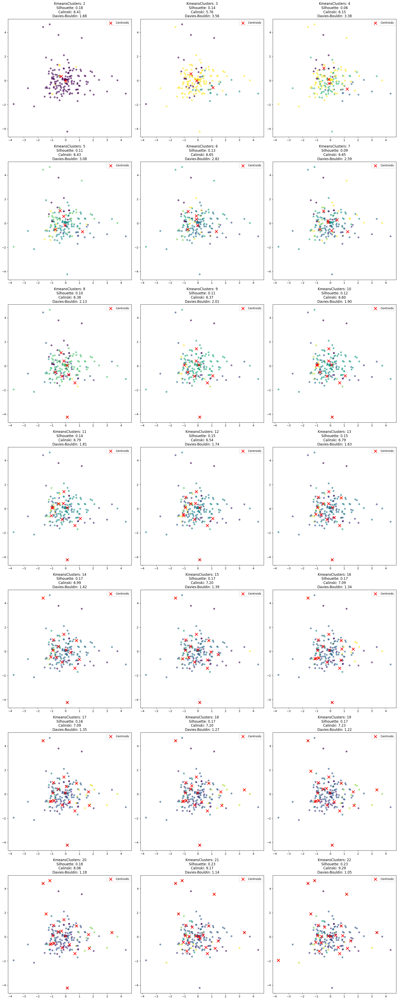

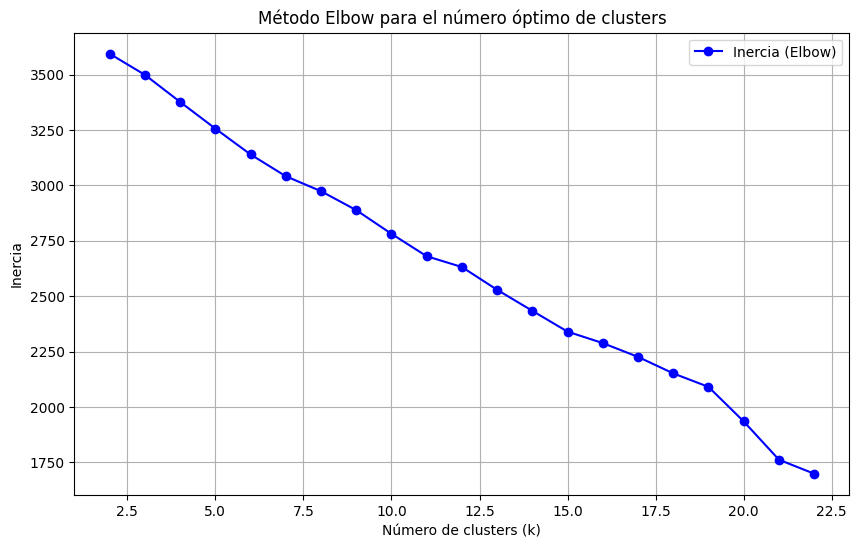

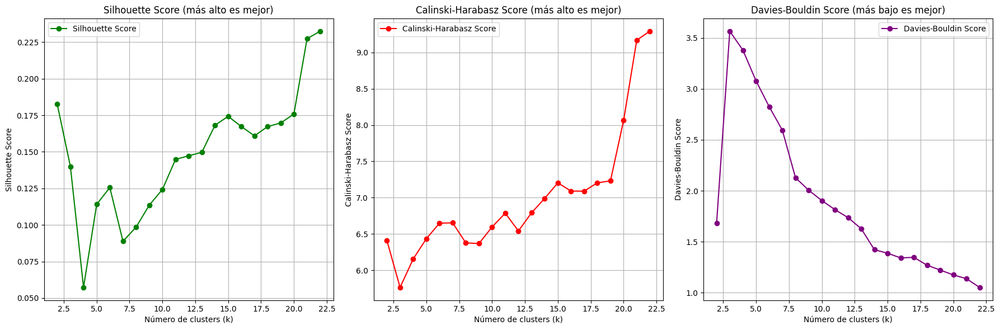

Model saved as: classification_model/GMM_k2_silh0.18_calinski6.41_davies1.68.joblib
Model saved as: classification_model/GMM_k3_silh0.14_calinski5.62_davies3.59.joblib
Model saved as: classification_model/GMM_k4_silh0.10_calinski5.40_davies4.27.joblib
Model saved as: classification_model/GMM_k5_silh0.12_calinski6.20_davies3.21.joblib
Model saved as: classification_model/GMM_k6_silh0.13_calinski6.43_davies2.97.joblib
Model saved as: classification_model/GMM_k7_silh0.09_calinski6.59_davies2.66.joblib
Model saved as: classification_model/GMM_k8_silh0.10_calinski6.38_davies2.13.joblib
Model saved as: classification_model/GMM_k9_silh0.11_calinski6.37_davies2.01.joblib
Model saved as: classification_model/GMM_k10_silh0.12_calinski6.60_davies1.90.joblib
Model saved as: classification_model/GMM_k11_silh0.14_calinski6.79_davies1.81.joblib
Model saved as: classification_model/GMM_k12_silh0.15_calinski6.54_davies1.74.joblib
Model saved as: classification_model/GMM_k13_silh0.15_calinski6.79_davies

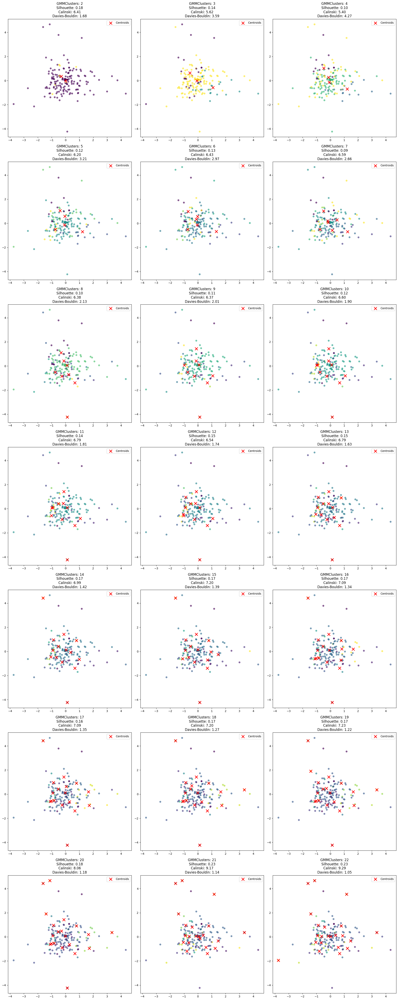

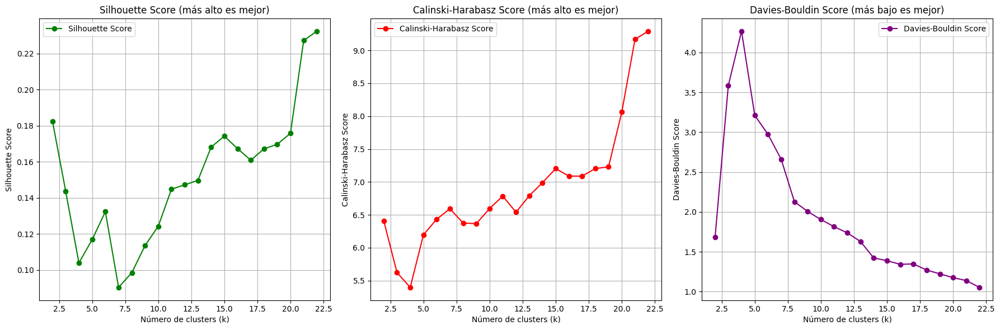

In [ ]:
path = '/content/isomap_ncomp20_nneigh40_error346.4654.csv'
evaluate_space_selection(path)

## For best Autoencoder ##

Model saved as: classification_model/Kmeans_k2_silh0.13_calinski1.48_davies0.75.joblib
Model saved as: classification_model/Kmeans_k3_silh0.16_calinski2.28_davies1.51.joblib
Model saved as: classification_model/Kmeans_k4_silh0.16_calinski2.17_davies1.29.joblib
Model saved as: classification_model/Kmeans_k5_silh0.11_calinski2.74_davies2.96.joblib
Model saved as: classification_model/Kmeans_k6_silh0.11_calinski2.58_davies2.64.joblib
Model saved as: classification_model/Kmeans_k7_silh0.12_calinski2.72_davies2.44.joblib
Model saved as: classification_model/Kmeans_k8_silh0.12_calinski2.76_davies1.94.joblib
Model saved as: classification_model/Kmeans_k9_silh0.06_calinski2.92_davies2.12.joblib
Model saved as: classification_model/Kmeans_k10_silh0.06_calinski2.82_davies1.99.joblib
Model saved as: classification_model/Kmeans_k11_silh0.06_calinski2.99_davies2.13.joblib
Model saved as: classification_model/Kmeans_k12_silh0.06_calinski2.91_davies2.03.joblib
Model saved as: classification_model/Kme

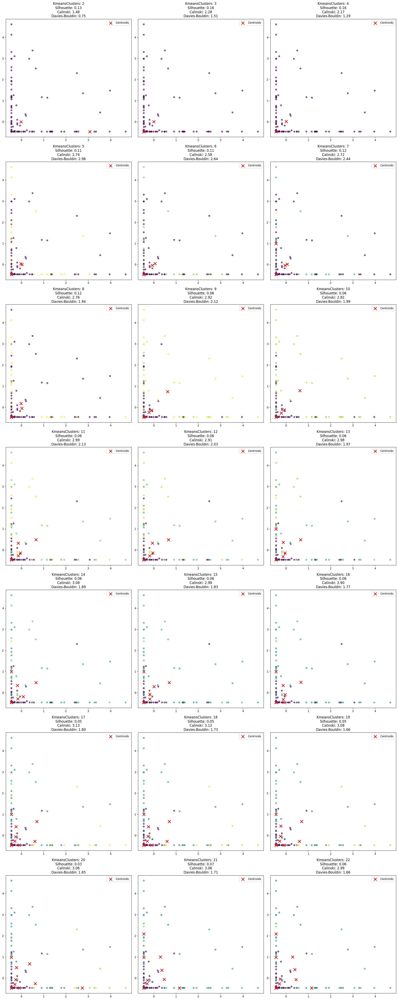

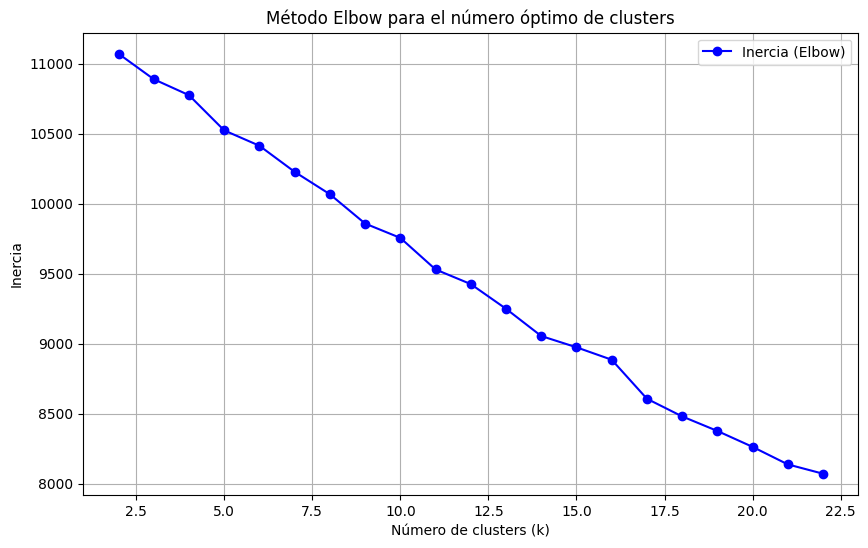

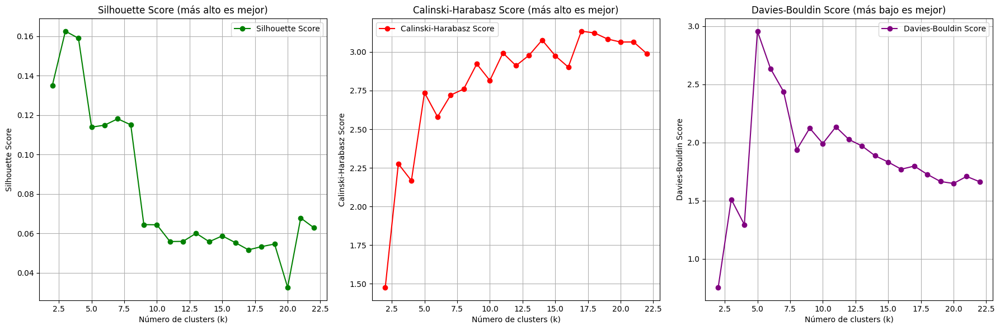

Model saved as: classification_model/GMM_k2_silh0.13_calinski1.48_davies0.75.joblib
Model saved as: classification_model/GMM_k3_silh0.16_calinski2.28_davies1.51.joblib
Model saved as: classification_model/GMM_k4_silh0.16_calinski2.17_davies1.29.joblib
Model saved as: classification_model/GMM_k5_silh0.12_calinski2.74_davies2.96.joblib
Model saved as: classification_model/GMM_k6_silh0.11_calinski2.58_davies2.64.joblib
Model saved as: classification_model/GMM_k7_silh0.12_calinski2.72_davies2.44.joblib
Model saved as: classification_model/GMM_k8_silh0.12_calinski2.76_davies1.94.joblib
Model saved as: classification_model/GMM_k9_silh0.06_calinski2.92_davies2.12.joblib
Model saved as: classification_model/GMM_k10_silh0.06_calinski2.82_davies1.99.joblib
Model saved as: classification_model/GMM_k11_silh0.06_calinski2.99_davies2.13.joblib
Model saved as: classification_model/GMM_k12_silh0.06_calinski2.91_davies2.03.joblib
Model saved as: classification_model/GMM_k13_silh0.06_calinski2.98_davies

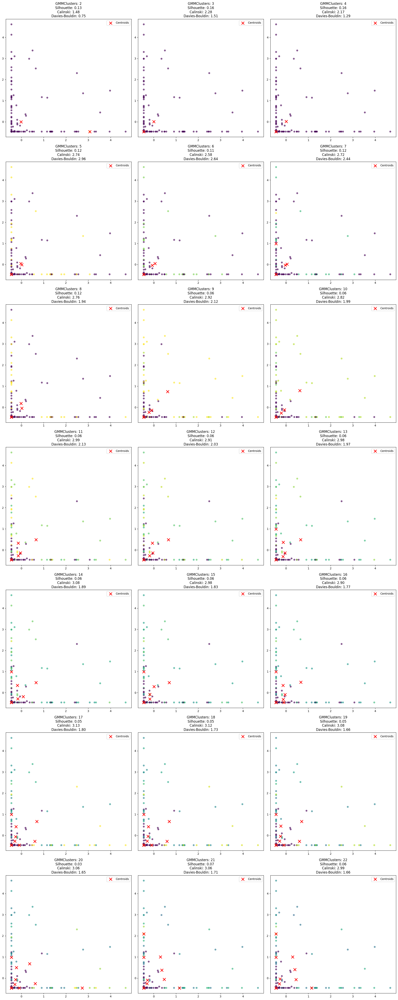

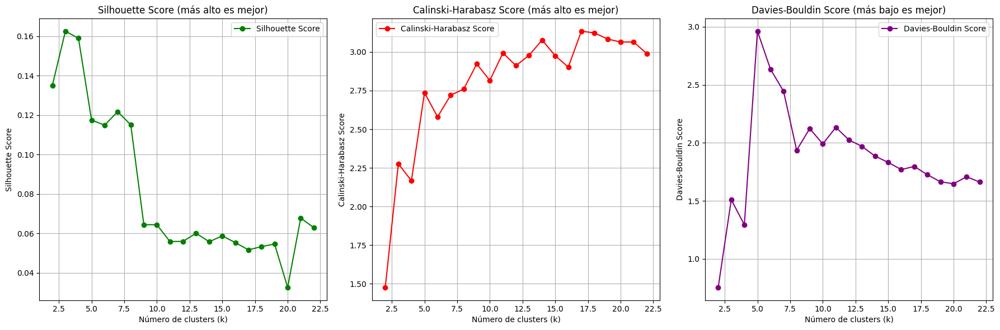

In [ ]:
path = '/content/autoencoder_typesparse_dim60_param1e-05_error0.8782.csv'
evaluate_space_selection(path)

## For best Umap ##

Model saved as: classification_model/Kmeans_k2_silh0.37_calinski129.67_davies1.08.joblib
Model saved as: classification_model/Kmeans_k3_silh0.36_calinski140.85_davies0.93.joblib
Model saved as: classification_model/Kmeans_k4_silh0.38_calinski165.36_davies0.82.joblib
Model saved as: classification_model/Kmeans_k5_silh0.37_calinski169.65_davies0.84.joblib
Model saved as: classification_model/Kmeans_k6_silh0.38_calinski170.22_davies0.79.joblib
Model saved as: classification_model/Kmeans_k7_silh0.34_calinski159.87_davies0.85.joblib
Model saved as: classification_model/Kmeans_k8_silh0.34_calinski161.66_davies0.86.joblib
Model saved as: classification_model/Kmeans_k9_silh0.32_calinski157.85_davies0.90.joblib
Model saved as: classification_model/Kmeans_k10_silh0.31_calinski151.47_davies0.93.joblib
Model saved as: classification_model/Kmeans_k11_silh0.34_calinski163.29_davies0.83.joblib
Model saved as: classification_model/Kmeans_k12_silh0.34_calinski166.75_davies0.80.joblib
Model saved as: cl

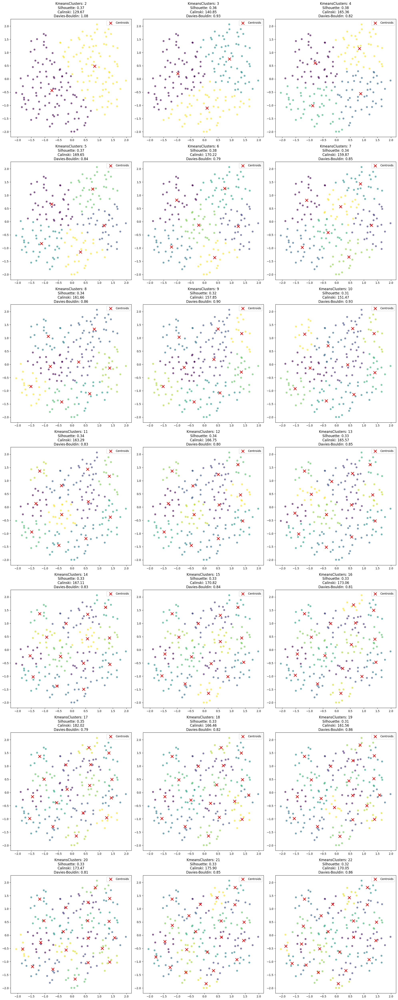

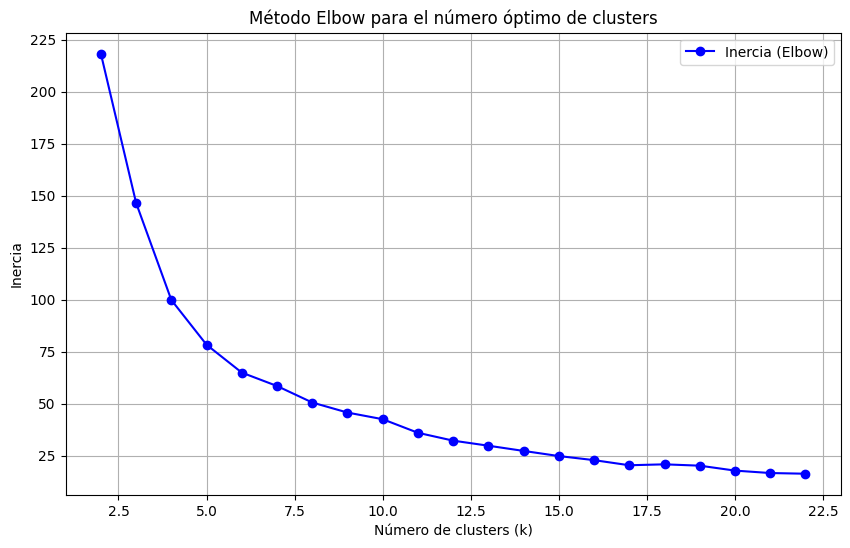

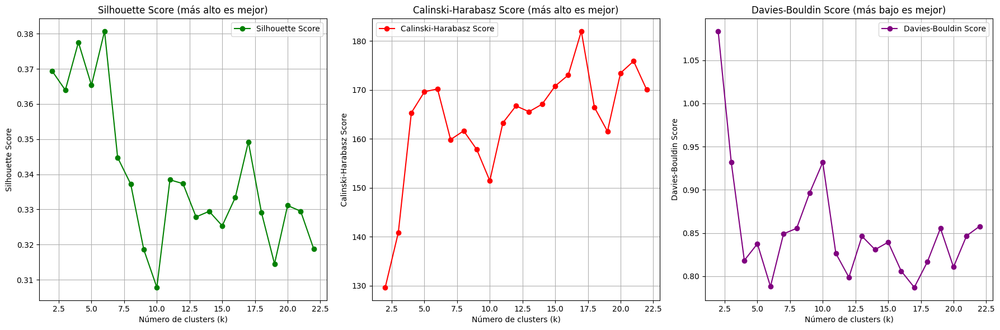

Model saved as: classification_model/GMM_k2_silh0.36_calinski123.52_davies1.10.joblib
Model saved as: classification_model/GMM_k3_silh0.36_calinski136.38_davies0.93.joblib
Model saved as: classification_model/GMM_k4_silh0.36_calinski151.86_davies0.86.joblib
Model saved as: classification_model/GMM_k5_silh0.35_calinski157.32_davies0.86.joblib
Model saved as: classification_model/GMM_k6_silh0.37_calinski157.11_davies0.78.joblib
Model saved as: classification_model/GMM_k7_silh0.33_calinski148.17_davies0.88.joblib
Model saved as: classification_model/GMM_k8_silh0.32_calinski147.85_davies0.86.joblib
Model saved as: classification_model/GMM_k9_silh0.31_calinski148.44_davies0.89.joblib
Model saved as: classification_model/GMM_k10_silh0.28_calinski132.83_davies0.94.joblib
Model saved as: classification_model/GMM_k11_silh0.32_calinski149.62_davies0.82.joblib
Model saved as: classification_model/GMM_k12_silh0.32_calinski154.42_davies0.82.joblib
Model saved as: classification_model/GMM_k13_silh0.

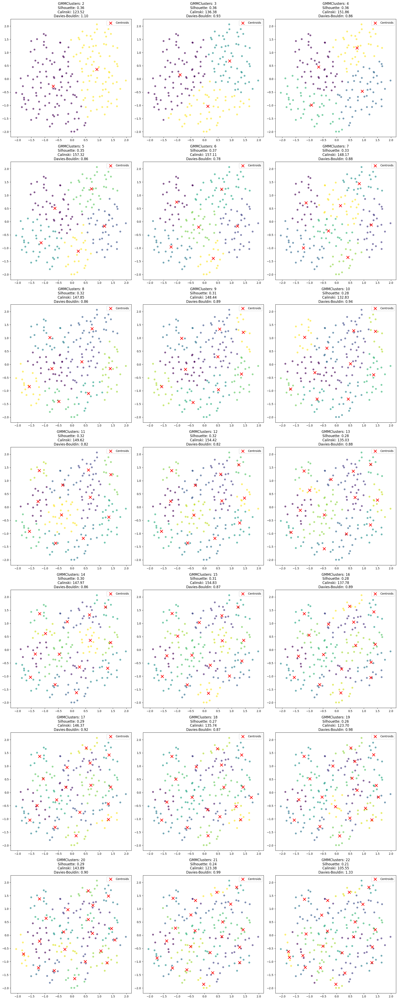

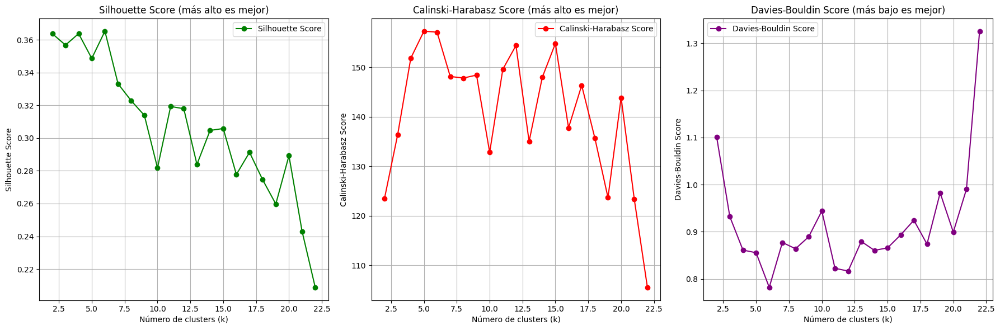

In [ ]:
path = '/content/umap_ncomp2_nneigh20_mindist0.7_metriccosine_error2006.8442.csv'
evaluate_space_selection(path)

# tf_idf_2 #

## Best Isomap ##

Model saved as: classification_model/Kmeans_k2_silh0.12_calinski4.11_davies3.19.joblib
Model saved as: classification_model/Kmeans_k3_silh0.18_calinski4.37_davies1.78.joblib
Model saved as: classification_model/Kmeans_k4_silh0.20_calinski4.93_davies1.55.joblib
Model saved as: classification_model/Kmeans_k5_silh0.21_calinski5.08_davies1.44.joblib
Model saved as: classification_model/Kmeans_k6_silh0.20_calinski5.18_davies1.40.joblib
Model saved as: classification_model/Kmeans_k7_silh0.19_calinski5.29_davies1.39.joblib
Model saved as: classification_model/Kmeans_k8_silh0.18_calinski5.38_davies1.25.joblib
Model saved as: classification_model/Kmeans_k9_silh0.19_calinski5.56_davies1.15.joblib
Model saved as: classification_model/Kmeans_k10_silh0.20_calinski5.81_davies1.13.joblib
Model saved as: classification_model/Kmeans_k11_silh0.21_calinski6.07_davies1.05.joblib
Model saved as: classification_model/Kmeans_k12_silh0.22_calinski6.17_davies1.02.joblib
Model saved as: classification_model/Kme

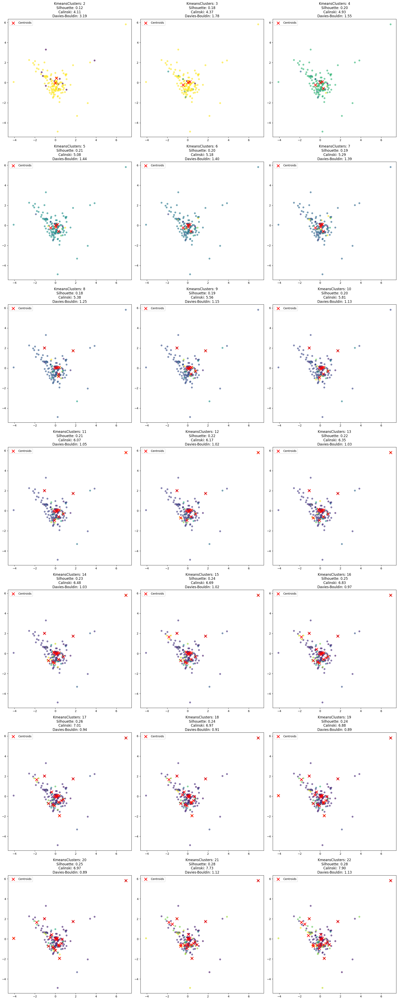

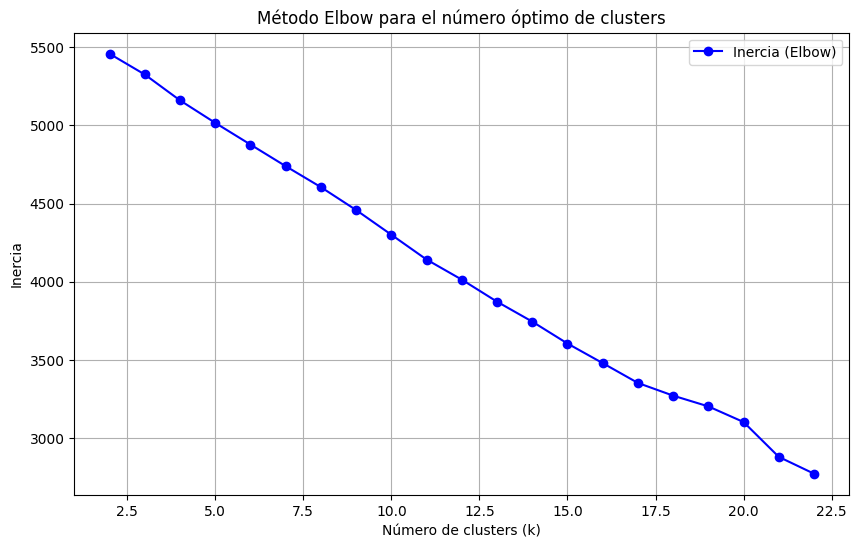

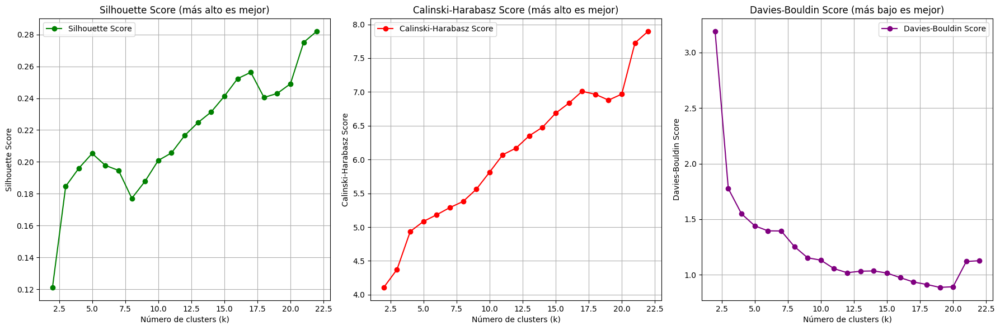

Model saved as: classification_model/GMM_k2_silh0.12_calinski4.11_davies3.19.joblib
Model saved as: classification_model/GMM_k3_silh0.18_calinski4.37_davies1.78.joblib
Model saved as: classification_model/GMM_k4_silh0.20_calinski4.93_davies1.55.joblib
Model saved as: classification_model/GMM_k5_silh0.21_calinski5.08_davies1.44.joblib
Model saved as: classification_model/GMM_k6_silh0.20_calinski5.18_davies1.40.joblib
Model saved as: classification_model/GMM_k7_silh0.19_calinski5.29_davies1.39.joblib
Model saved as: classification_model/GMM_k8_silh0.18_calinski5.38_davies1.25.joblib
Model saved as: classification_model/GMM_k9_silh0.19_calinski5.56_davies1.15.joblib
Model saved as: classification_model/GMM_k10_silh0.20_calinski5.81_davies1.13.joblib
Model saved as: classification_model/GMM_k11_silh0.21_calinski6.07_davies1.05.joblib
Model saved as: classification_model/GMM_k12_silh0.22_calinski6.17_davies1.02.joblib
Model saved as: classification_model/GMM_k13_silh0.22_calinski6.35_davies

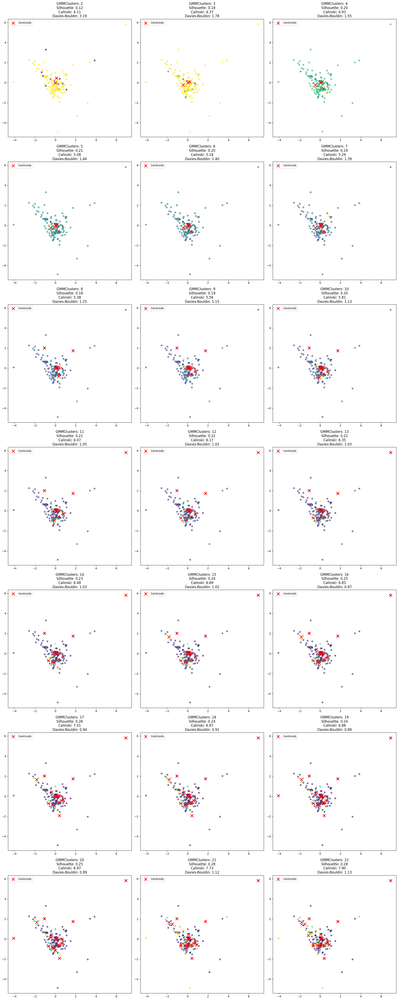

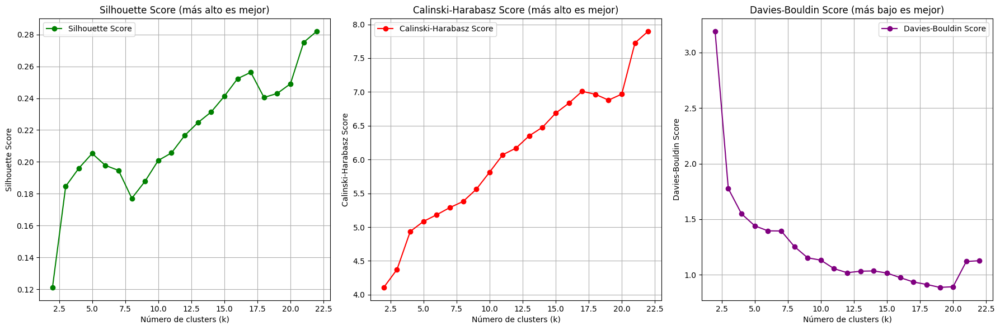

In [ ]:
path = '/content/isomap_ncomp30_nneigh60_error288.6896.csv'
evaluate_space_selection(path)

## Best Autoencoder ##

Model saved as: classification_model/Kmeans_k2_silh0.30_calinski2.74_davies0.56.joblib
Model saved as: classification_model/Kmeans_k3_silh0.25_calinski2.97_davies1.15.joblib
Model saved as: classification_model/Kmeans_k4_silh0.13_calinski2.57_davies0.64.joblib
Model saved as: classification_model/Kmeans_k5_silh0.12_calinski2.38_davies0.65.joblib
Model saved as: classification_model/Kmeans_k6_silh0.11_calinski2.28_davies0.65.joblib
Model saved as: classification_model/Kmeans_k7_silh0.12_calinski2.43_davies0.81.joblib
Model saved as: classification_model/Kmeans_k8_silh0.13_calinski2.35_davies0.79.joblib
Model saved as: classification_model/Kmeans_k9_silh0.13_calinski2.34_davies0.77.joblib
Model saved as: classification_model/Kmeans_k10_silh0.07_calinski2.61_davies1.75.joblib
Model saved as: classification_model/Kmeans_k11_silh0.07_calinski2.59_davies1.65.joblib
Model saved as: classification_model/Kmeans_k12_silh0.02_calinski2.58_davies1.67.joblib
Model saved as: classification_model/Kme

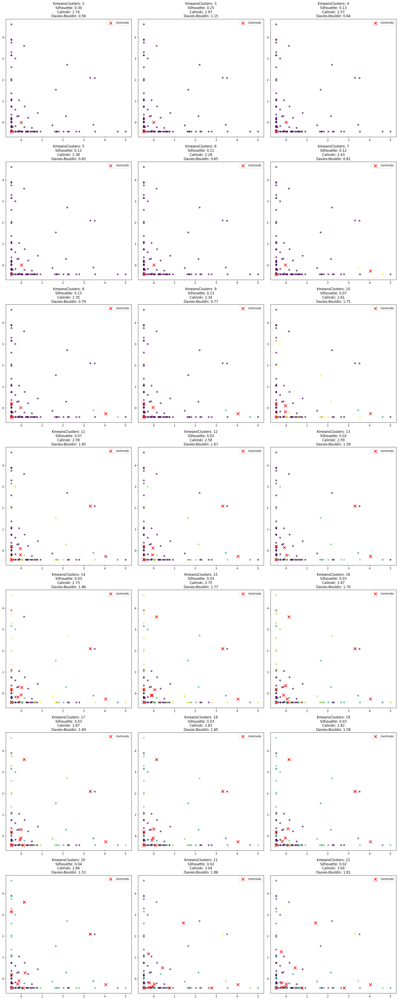

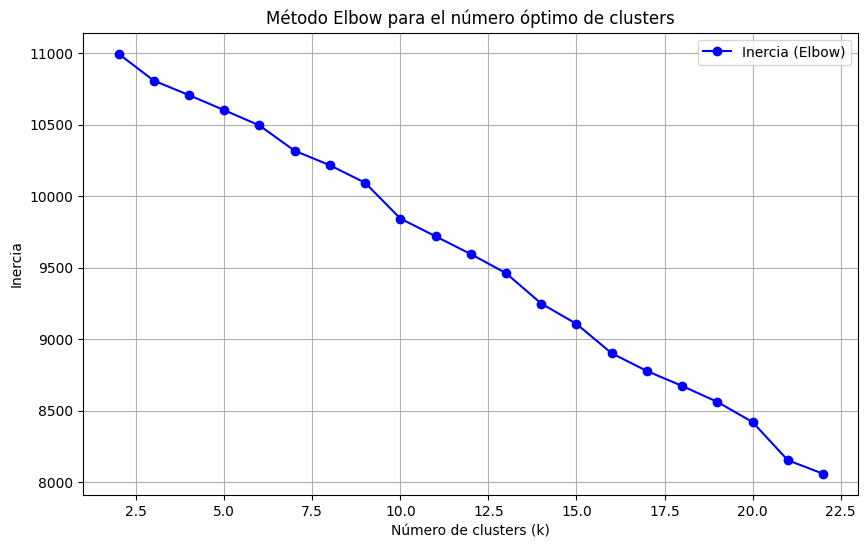

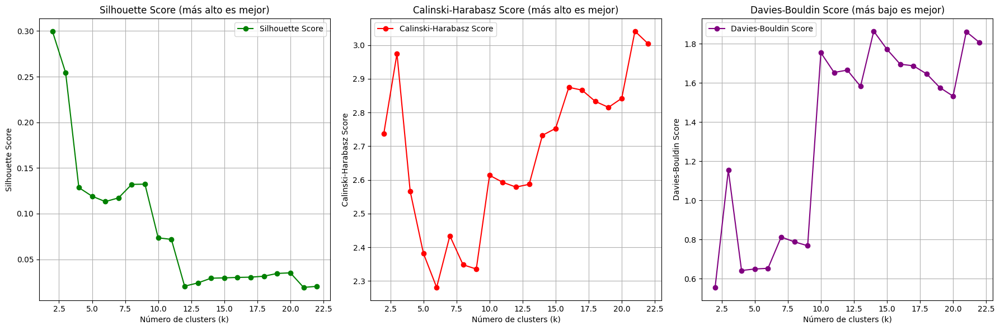

Model saved as: classification_model/GMM_k2_silh0.30_calinski2.74_davies0.56.joblib
Model saved as: classification_model/GMM_k3_silh0.25_calinski2.97_davies1.15.joblib
Model saved as: classification_model/GMM_k4_silh0.13_calinski2.57_davies0.64.joblib
Model saved as: classification_model/GMM_k5_silh0.12_calinski2.38_davies0.65.joblib
Model saved as: classification_model/GMM_k6_silh0.11_calinski2.28_davies0.65.joblib
Model saved as: classification_model/GMM_k7_silh0.12_calinski2.43_davies0.81.joblib
Model saved as: classification_model/GMM_k8_silh0.13_calinski2.35_davies0.79.joblib
Model saved as: classification_model/GMM_k9_silh0.13_calinski2.34_davies0.77.joblib
Model saved as: classification_model/GMM_k10_silh0.07_calinski2.61_davies1.75.joblib
Model saved as: classification_model/GMM_k11_silh0.07_calinski2.59_davies1.65.joblib
Model saved as: classification_model/GMM_k12_silh0.02_calinski2.58_davies1.67.joblib
Model saved as: classification_model/GMM_k13_silh0.02_calinski2.59_davies

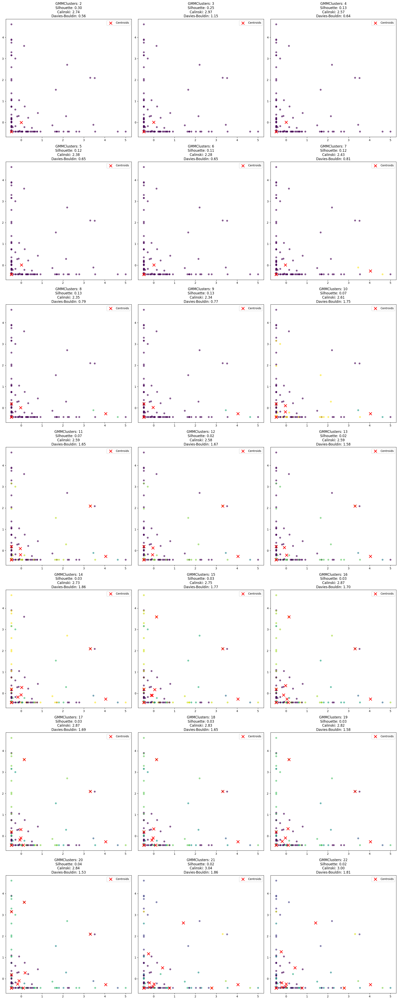

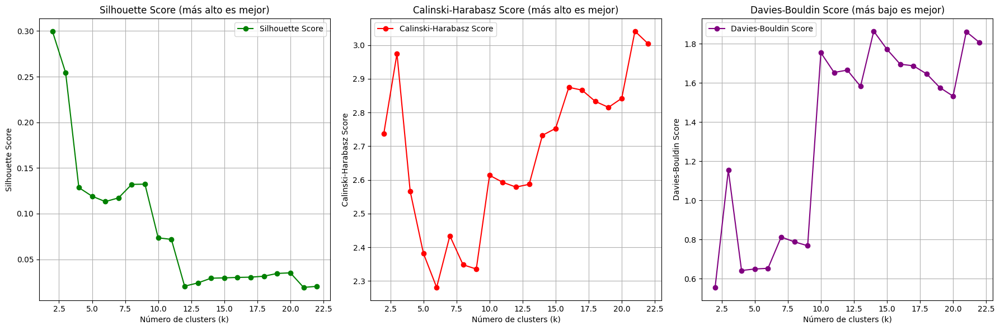

In [ ]:
path = '/content/autoencoder_typesparse_dim60_param1e-05_error0.8737.csv'
evaluate_space_selection(path)

## Best Umap ##

Model saved as: classification_model/Kmeans_k2_silh0.33_calinski101.24_davies1.21.joblib
Model saved as: classification_model/Kmeans_k3_silh0.39_calinski156.09_davies0.83.joblib
Model saved as: classification_model/Kmeans_k4_silh0.36_calinski153.81_davies0.84.joblib
Model saved as: classification_model/Kmeans_k5_silh0.36_calinski171.44_davies0.86.joblib
Model saved as: classification_model/Kmeans_k6_silh0.34_calinski159.23_davies0.90.joblib
Model saved as: classification_model/Kmeans_k7_silh0.31_calinski149.92_davies0.93.joblib
Model saved as: classification_model/Kmeans_k8_silh0.34_calinski162.76_davies0.90.joblib
Model saved as: classification_model/Kmeans_k9_silh0.34_calinski162.38_davies0.88.joblib
Model saved as: classification_model/Kmeans_k10_silh0.35_calinski164.14_davies0.87.joblib
Model saved as: classification_model/Kmeans_k11_silh0.35_calinski167.48_davies0.84.joblib
Model saved as: classification_model/Kmeans_k12_silh0.34_calinski164.02_davies0.84.joblib
Model saved as: cl

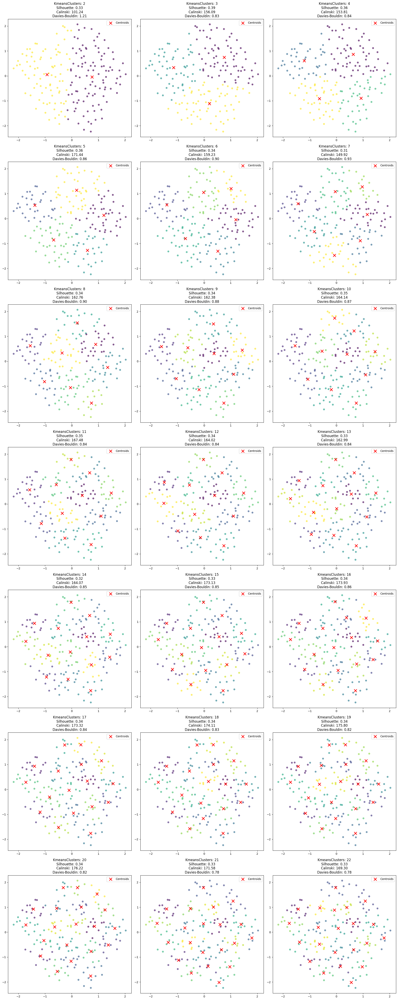

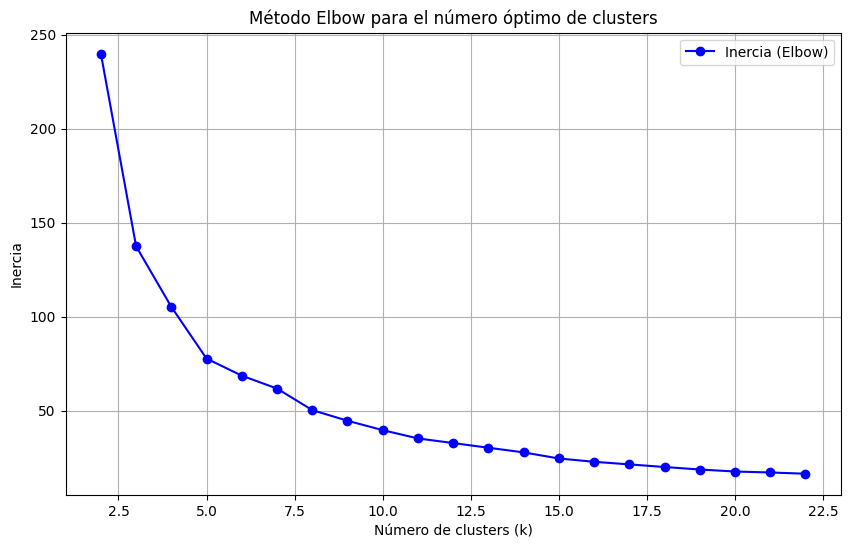

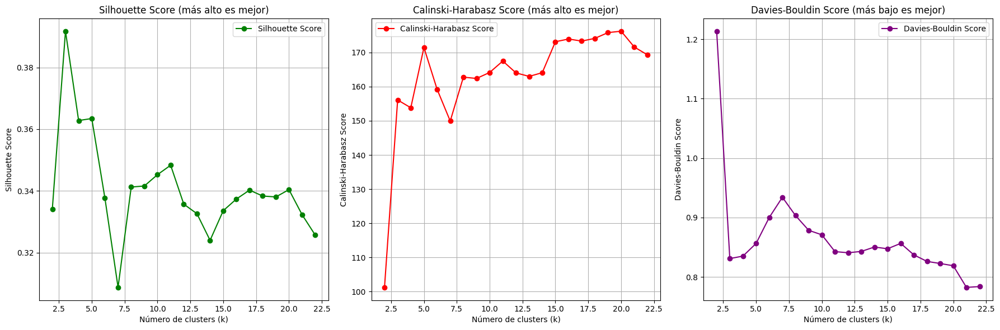

Model saved as: classification_model/GMM_k2_silh0.34_calinski100.27_davies1.21.joblib
Model saved as: classification_model/GMM_k3_silh0.39_calinski153.01_davies0.83.joblib
Model saved as: classification_model/GMM_k4_silh0.36_calinski149.62_davies0.83.joblib
Model saved as: classification_model/GMM_k5_silh0.32_calinski144.53_davies0.83.joblib
Model saved as: classification_model/GMM_k6_silh0.33_calinski147.80_davies0.86.joblib
Model saved as: classification_model/GMM_k7_silh0.30_calinski138.42_davies0.89.joblib
Model saved as: classification_model/GMM_k8_silh0.33_calinski159.00_davies0.91.joblib
Model saved as: classification_model/GMM_k9_silh0.33_calinski153.01_davies0.89.joblib
Model saved as: classification_model/GMM_k10_silh0.32_calinski143.29_davies0.90.joblib
Model saved as: classification_model/GMM_k11_silh0.31_calinski144.23_davies0.89.joblib
Model saved as: classification_model/GMM_k12_silh0.31_calinski146.07_davies0.89.joblib
Model saved as: classification_model/GMM_k13_silh0.

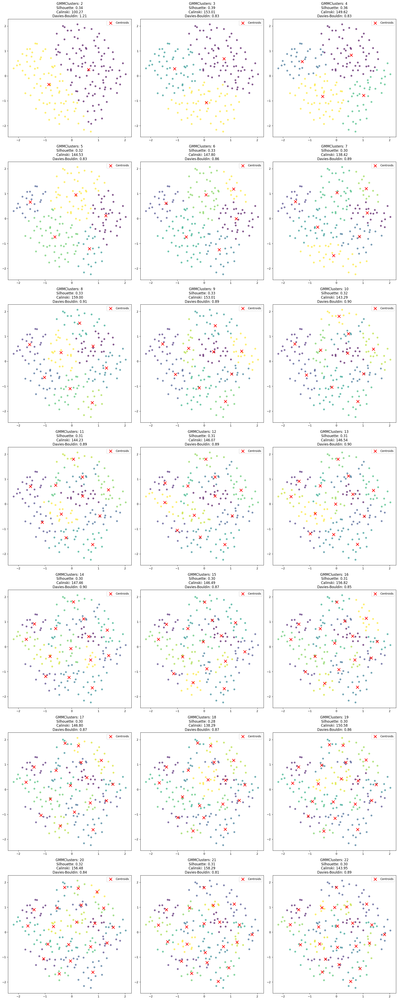

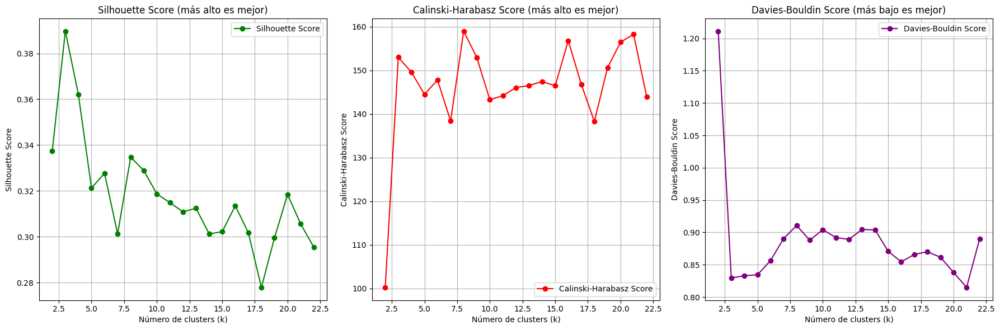

In [ ]:
path = '/content/umap_ncomp2_nneigh20_mindist0.7_metriccosine_error2009.5221.csv'
evaluate_space_selection(path)

# Conclusiones de clustering #

Para el primero td_idf se usa:

Best KNN Umap: 10 Clus

		Sil: 0.36

		Calins: 166.20

		Davis: 0.81


Para el segundo:


Best KNN Umap: 21 Clus

		Sil: 0.33

		Calins: 171.58

		Davis: 0.78
    